## Machine Learning Project: Bike Sharing Dataset - Tony Silva

Once again, I use bikeshare data from Capital Bikeshare, feature on Kaggle. Here I plan to use machine learning to predict the demand for bikes, and to explore the features that have the greatest affect on demand. Finally I will compare different forms of regression, including Ridge, and Lasso. 

In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats 
from scipy.stats import spearmanr
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn import metrics
from sklearn.metrics import r2_score
from sklearn.model_selection import KFold, cross_val_predict
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
import datetime
import math
import seaborn as sns

%pylab inline
%config InlineBackend.figure_formats = ['svg'] # 'svg', 'retina'
%matplotlib inline

Populating the interactive namespace from numpy and matplotlib


### The Objective and Planning

The main objective of this analysis is to get a working comparison of a linear regression model, a Ridge regression model, and a Lasso regression model. To accomplish this task, pipelines are employed along with GridSearchCV so scaling, modeling, hyperparameter tuning and cross validation can all be done in one step.

The plan is to do some initial EDA as in the previous project, but we will cut the categorical columns and just look at the numeric columns for now. Additionally, one of the columns representing temperature is dropped to avoid multicollinearity and the models are run using only the humidity, windspeed, temp features and count as the target.

In [2]:
# Read in the dataset

filepath = "train.csv"
data = pd.read_csv(filepath)
data.head(20)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count
0,2011-01-01 00:00:00,1,0,0,1,9.84,14.395,81,0.0000,3,13,16
1,2011-01-01 01:00:00,1,0,0,1,9.02,13.635,80,0.0000,8,32,40
2,2011-01-01 02:00:00,1,0,0,1,9.02,13.635,80,0.0000,5,27,32
3,2011-01-01 03:00:00,1,0,0,1,9.84,14.395,75,0.0000,3,10,13
4,2011-01-01 04:00:00,1,0,0,1,9.84,14.395,75,0.0000,0,1,1
5,2011-01-01 05:00:00,1,0,0,2,9.84,12.880,75,6.0032,0,1,1
6,2011-01-01 06:00:00,1,0,0,1,9.02,13.635,80,0.0000,2,0,2
7,2011-01-01 07:00:00,1,0,0,1,8.20,12.880,86,0.0000,1,2,3
8,2011-01-01 08:00:00,1,0,0,1,9.84,14.395,75,0.0000,1,7,8
9,2011-01-01 09:00:00,1,0,0,1,13.12,17.425,76,0.0000,8,6,14


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10886 entries, 0 to 10885
Data columns (total 12 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   datetime    10886 non-null  object 
 1   season      10886 non-null  int64  
 2   holiday     10886 non-null  int64  
 3   workingday  10886 non-null  int64  
 4   weather     10886 non-null  int64  
 5   temp        10886 non-null  float64
 6   atemp       10886 non-null  float64
 7   humidity    10886 non-null  int64  
 8   windspeed   10886 non-null  float64
 9   casual      10886 non-null  int64  
 10  registered  10886 non-null  int64  
 11  count       10886 non-null  int64  
dtypes: float64(3), int64(8), object(1)
memory usage: 1020.7+ KB


In [4]:
# Number of rows, number of columns

data.shape

(10886, 12)

In [5]:
# Get the column names

data.columns

Index(['datetime', 'season', 'holiday', 'workingday', 'weather', 'temp',
       'atemp', 'humidity', 'windspeed', 'casual', 'registered', 'count'],
      dtype='object')

In [6]:
# Get the data types

data.dtypes

datetime       object
season          int64
holiday         int64
workingday      int64
weather         int64
temp          float64
atemp         float64
humidity        int64
windspeed     float64
casual          int64
registered      int64
count           int64
dtype: object

### Cleaning and Transforming the Data

It was a suprise to me that this particular dataset was already clean. The similar dataset I saw during the assessment was not clean and had null values to take care of. The season and weather features were also categorical. In order to try performing the regressions I will give these values from the categorical features names and then execute one-hot encoding. I will also change the datetime attribute into categorical features for year and month. The label encoding, from will work as follows:

season:  1 = spring, 2 = summer, 3 = fall, 4 = winter

weather: 1 = nice,   2 = fair,   3 = poor, 4 = bad

The casual and registered features will be removed for this model, as they don't contribute to the model.

In [7]:
# Find the null values

data.isnull().sum()

datetime      0
season        0
holiday       0
workingday    0
weather       0
temp          0
atemp         0
humidity      0
windspeed     0
casual        0
registered    0
count         0
dtype: int64

In [8]:
# Count the unique values

data.nunique()

datetime      10886
season            4
holiday           2
workingday        2
weather           4
temp             49
atemp            60
humidity         89
windspeed        28
casual          309
registered      731
count           822
dtype: int64

In [9]:
data['season'] = data['season'].astype(str)
data['season'] = data['season'].replace(str(1), "spring")
data['season'] = data['season'].replace(str(2), "summer")
data['season'] = data['season'].replace(str(3), "fall")
data['season'] = data['season'].replace(str(4), "winter")

In [10]:
data['holiday'] = data['holiday'].astype(str)
data['holiday'] = data['holiday'].replace(str(0), "false")
data['holiday'] = data['holiday'].replace(str(1), "true")

In [11]:
data['workingday'] = data['workingday'].astype(str)
data['workingday'] = data['workingday'].replace(str(0), "false")
data['workingday'] = data['workingday'].replace(str(1), "true")

In [12]:
data['weather'] = data['weather'].astype(str)
data['weather'] = data['weather'].replace(str(1), "nice")
data['weather'] = data['weather'].replace(str(2), "fair")
data['weather'] = data['weather'].replace(str(3), "poor")
data['weather'] = data['weather'].replace(str(4), "bad")

In [13]:
data['year'] = pd.DatetimeIndex(data['datetime']).year
data['month'] = pd.DatetimeIndex(data['datetime']).month

In [14]:
data['year'] = data['year'].astype(str)
data['month'] = data['month'].astype(str)

data['month'] = data['month'].replace(str(1), "January")
data['month'] = data['month'].replace(str(2), "February")
data['month'] = data['month'].replace(str(3), "March")
data['month'] = data['month'].replace(str(4), "April")
data['month'] = data['month'].replace(str(5), "May")
data['month'] = data['month'].replace(str(6), "June")
data['month'] = data['month'].replace(str(7), "July")
data['month'] = data['month'].replace(str(8), "August")
data['month'] = data['month'].replace(str(9), "September")
data['month'] = data['month'].replace(str(10), "October")
data['month'] = data['month'].replace(str(11), "November")
data['month'] = data['month'].replace(str(12), "December")


In [15]:
# This is an easier way to do the previous label encoding
#codes = {1:'spring',2:'summer',3:'fall',4:'winter'}
#bi['season'] = bike['season'].map(codes)

In [16]:
data.head(-20)

,datetime,season,holiday,workingday,weather,temp,atemp,humidity,windspeed,casual,registered,count,year,month
0,2011-01-01 00:00:00,spring,false,false,nice,9.84,14.395,81,0.0000,3,13,16,2011,January
1,2011-01-01 01:00:00,spring,false,false,nice,9.02,13.635,80,0.0000,8,32,40,2011,January
2,2011-01-01 02:00:00,spring,false,false,nice,9.02,13.635,80,0.0000,5,27,32,2011,January
3,2011-01-01 03:00:00,spring,false,false,nice,9.84,14.395,75,0.0000,3,10,13,2011,January
4,2011-01-01 04:00:00,spring,false,false,nice,9.84,14.395,75,0.0000,0,1,1,2011,January
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10861,2012-12-18 23:00:00,winter,false,true,nice,13.94,17.425,49,6.0032,1,80,81,2012,December
10862,2012-12-19 00:00:00,winter,false,true,nice,12.30,15.910,61,0.0000,6,35,41,2012,December
10863,2012-12-19 01:00:00,winter,false,true,nice,12.30,15.910,65,6.0032,1,14,15,2012,December
10864,2012-12-19 02:00:00,winter,false,true,nice,11.48,15.150,65,6.0032,1,2,3,2012,December


In [17]:
data.drop(['datetime', 'casual', 'registered'], axis=1, inplace=True)

In [18]:
data.dtypes

season         object
holiday        object
workingday     object
weather        object
temp          float64
atemp         float64
humidity        int64
windspeed     float64
count           int64
year           object
month          object
dtype: object

In [19]:
# Get statistics

data.describe().T

,count,mean,std,min,25%,50%,75%,max
temp,10886.0,20.230860,7.791590,0.82,13.9400,20.500,26.2400,41.0000
atemp,10886.0,23.655084,8.474601,0.76,16.6650,24.240,31.0600,45.4550
humidity,10886.0,61.886460,19.245033,0.00,47.0000,62.000,77.0000,100.0000
windspeed,10886.0,12.799395,8.164537,0.00,7.0015,12.998,16.9979,56.9969
count,10886.0,191.574132,181.144454,1.00,42.0000,145.000,284.0000,977.0000


### Some EDA with Visualization

In order to get a feel for the data, I use some initial visualization of the feature correlations, with bar charts of the count versus the year, the month, season, and weather. Pairplot is also used for further visual analysis of the features. the atemp feature is dropped, as it correlates almost exactly with temp.

<AxesSubplot:>

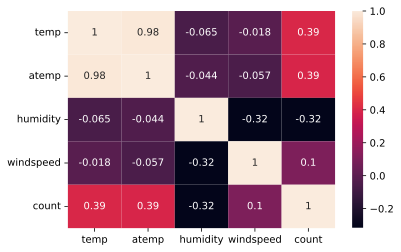

In [20]:
sns.heatmap(data.corr(),annot=True)

In [21]:
data.drop('atemp', axis=1, inplace=True)

In [22]:
sns.pairplot(data)

/Users/tonysilva/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='season', ylabel='count'>

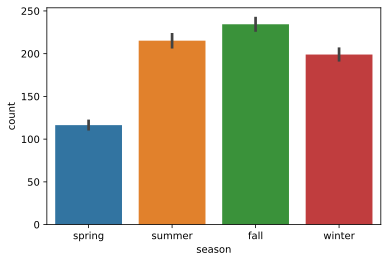

In [23]:
sns.barplot('season','count', data=data)

<AxesSubplot:xlabel='weather', ylabel='count'>

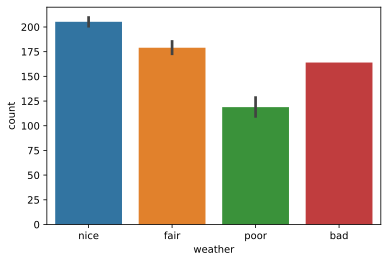

In [28]:
sns.barplot(x = 'weather', y = 'count',data = data)

<AxesSubplot:xlabel='year', ylabel='count'>

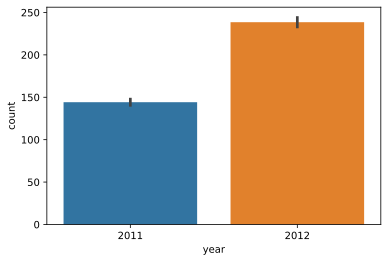

In [29]:
sns.barplot(x = 'year', y = 'count', data = data)

<AxesSubplot:xlabel='month', ylabel='count'>

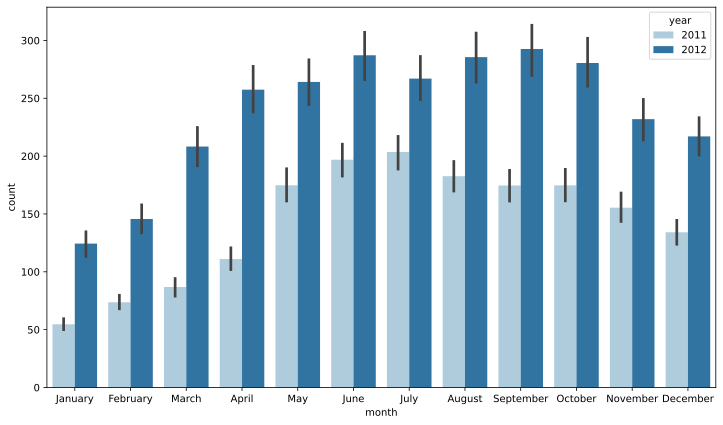

In [33]:
plt.figure(figsize=(12,7))
sns.barplot(x = 'month', y = 'count', hue='year', data = data, palette = 'Paired')

### Some Feature Engineering

In the initial version of this report I used a very bare-bones process, however in order to improve I decided to include an attempt at feature engineering. The first goal is to check the target variable for skew, among others. From the visualizations in the last section, it seems the count is the only feature that needs normalization. 

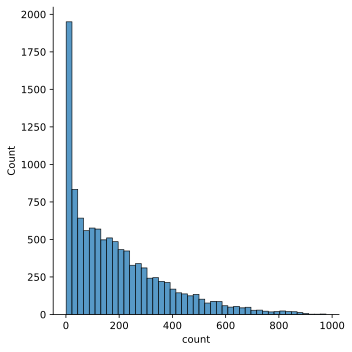

In [27]:
sns.displot(data['count'])

In [28]:
data['count'] = data['count'].astype(float64)
data['humidity'] = data['humidity'].astype(float64)

In [29]:
data.dtypes

season         object
holiday        object
workingday     object
weather        object
temp          float64
humidity      float64
windspeed     float64
count         float64
year           object
month          object
dtype: object

In [30]:
# Create a list of float colums to check for skewing
mask = data.dtypes == np.float64
float_cols = data.columns[mask]

skew_limit = 0.75 # define a limit above which we will log transform
skew_vals = data[float_cols].skew()

In [31]:
# Showing the skewed columns
skew_cols = (skew_vals
             .sort_values(ascending=False)
             .to_frame()
             .rename(columns={0:'Skew'})
             .query('abs(Skew) > {}'.format(skew_limit)))

skew_cols

,Skew
count,1.242066


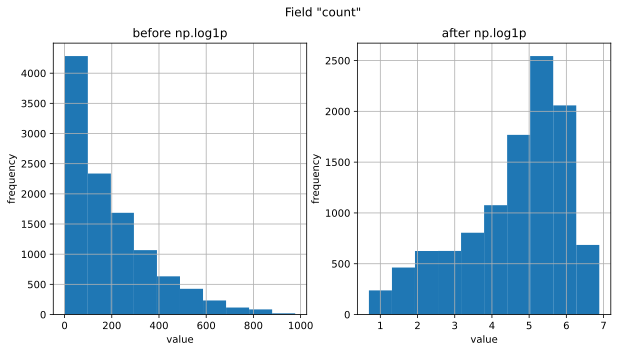

In [33]:
# Let's look at what happens to one of these features, when we apply np.log1p visually.
# Make copy

df = data

# Choose a field
field = "count"

# Create two "subplots" and a "figure" using matplotlib
fig, (ax_before, ax_after) = plt.subplots(1, 2, figsize=(10, 5))

# Create a histogram on the "ax_before" subplot
df[field].hist(ax=ax_before)

# Apply a log transformation (numpy syntax) to this column
df[field].apply(np.log1p).hist(ax=ax_after)

# Formatting of titles etc. for each subplot
ax_before.set(title='before np.log1p', ylabel='frequency', xlabel='value')
ax_after.set(title='after np.log1p', ylabel='frequency', xlabel='value')
fig.suptitle('Field "{}"'.format(field));

In [34]:
# Perform the skew transformation:

#for col in skew_cols.index.values:
    #if col == 'count':
        #continue
    #data[col] = data[col].apply(np.log1p)
    
data['count'] = data['count'].apply(np.log1p)

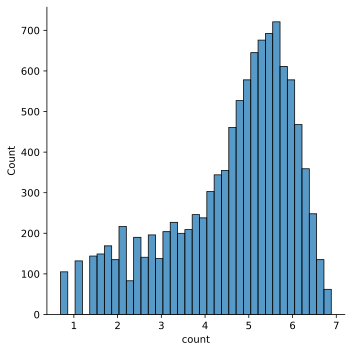

In [35]:
sns.displot(data['count'])

In [36]:
# Get a Pd.Series consisting of all the string categoricals
one_hot_encode_cols = data.dtypes[data.dtypes == 'object']  # filtering by string categoricals
one_hot_encode_cols = one_hot_encode_cols.index.tolist()  # list of categorical fields

data[one_hot_encode_cols].head()

,season,holiday,workingday,weather,year,month
0,spring,false,false,nice,2011,January
1,spring,false,false,nice,2011,January
2,spring,false,false,nice,2011,January
3,spring,false,false,nice,2011,January
4,spring,false,false,nice,2011,January


In [37]:
# Do the one hot encoding
data = pd.get_dummies(data, drop_first=False)
data.describe().T

,count,mean,std,min,25%,50%,75%,max
temp,10886.0,20.230860,7.791590,0.820000,13.9400,20.500000,26.240000,41.00000
humidity,10886.0,61.886460,19.245033,0.000000,47.0000,62.000000,77.000000,100.00000
windspeed,10886.0,12.799395,8.164537,0.000000,7.0015,12.998000,16.997900,56.99690
count,10886.0,4.591364,1.419454,0.693147,3.7612,4.983607,5.652489,6.88551
season_fall,10886.0,0.251056,0.433641,0.000000,0.0000,0.000000,1.000000,1.00000
season_spring,10886.0,0.246739,0.431133,0.000000,0.0000,0.000000,0.000000,1.00000
season_summer,10886.0,0.251056,0.433641,0.000000,0.0000,0.000000,1.000000,1.00000
season_winter,10886.0,0.251148,0.433694,0.000000,0.0000,0.000000,1.000000,1.00000
holiday_false,10886.0,0.971431,0.166599,0.000000,1.0000,1.000000,1.000000,1.00000
holiday_true,10886.0,0.028569,0.166599,0.000000,0.0000,0.000000,0.000000,1.00000


### Linear Regression Model

In [38]:
bike_data = data
y_col = "count"

X = bike_data.drop(y_col, axis=1)
y = bike_data[y_col]

In [39]:
kf = KFold(shuffle=True, random_state=72018, n_splits=3)

In [41]:
estimator = Pipeline([("scaler", StandardScaler()),
        ("regression", LinearRegression())])

#estimator.get_params().keys()
prediction = cross_val_predict(estimator, X, y, cv = kf)

In [42]:
r2_score(y, prediction) 

-6.288842715742149e+21

### Using Ridge Regression

In [63]:

estimator = Pipeline([("scaler", StandardScaler()),
        ("polynomial_features", PolynomialFeatures()),
        ("ridge_regression", Ridge())])

params = {
    'polynomial_features__degree': [1, 2, 3],
    'ridge_regression__alpha': np.geomspace(1, 20, num=30)
}

grid1 = GridSearchCV(estimator, params, cv=kf)

#(0.3438553153258419,
 #{'polynomial_features__degree': 2,
  #'ridge_regression__alpha': 18.037107446454083})

In [64]:
grid1.fit(X,y)

GridSearchCV(cv=KFold(n_splits=3, random_state=72018, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('polynomial_features',
                                        PolynomialFeatures()),
                                       ('ridge_regression', Ridge())]),
             param_grid={'polynomial_features__degree': [1, 2, 3],
                         'ridge_regression__alpha': array([ 1.        ,  1.10882524,  1.22949341,  1.36329333,  1.51165405,
        1.67616017,  1.8585687 ,  2.06082789,  2.28509798,  2.53377432,
        2.80951292,  3.11525883,  3.45427763,  3.83019022,  4.24701159,
        4.70919365,  5.22167278,  5.78992257,  6.42001229,  7.11867167,
        7.89336283,  8.75235993,  9.70483761, 10.76096889, 11.93203392,
       13.23054038, 14.67035711, 16.26686225, 18.03710745, 20.        ])})

In [65]:
grid1.best_score_, grid1.best_params_

(0.3438553153258419,
 {'polynomial_features__degree': 2,
  'ridge_regression__alpha': 18.037107446454083})

In [66]:
y_predict1 = grid1.predict(X)

In [67]:
# This includes both in-sample and out-of-sample
r2_score(y, y_predict1)

0.36656898597082677

### Using Lasso Regression

In [77]:
estimator = Pipeline([("scaler", StandardScaler()),
        ("polynomial_features", PolynomialFeatures()),
        ("lasso_regression", Lasso())])

params = {
    'polynomial_features__degree': [1, 2, 3],
    'lasso_regression__alpha': np.geomspace(0.1,1, num=10)
}

grid2 = GridSearchCV(estimator, params, cv=kf)

In [78]:
grid2.fit(X,y)

GridSearchCV(cv=KFold(n_splits=3, random_state=72018, shuffle=True),
             estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('polynomial_features',
                                        PolynomialFeatures()),
                                       ('lasso_regression', Lasso())]),
             param_grid={'lasso_regression__alpha': array([0.1       , 0.12915497, 0.16681005, 0.21544347, 0.27825594,
       0.35938137, 0.46415888, 0.59948425, 0.77426368, 1.        ]),
                         'polynomial_features__degree': [1, 2, 3]})

In [79]:
grid2.best_score_, grid2.best_params_

(0.2986200260672745,
 {'lasso_regression__alpha': 0.1, 'polynomial_features__degree': 3})

In [80]:
y_predict2 = grid2.predict(X)

In [81]:
# This includes both in-sample and out-of-sample
r2_score(y, y_predict2)

0.30761572938055204

### Key Findings and Flaws

In my inital model, I left out all of the categorical features and worked with only the numeric. I was not able to get the R^2 value above 0.28. Suprisingly, all three models were close to withing a small fraction, however the regular linear regression model actually did perform a very small fraction (0.00001 to 0.00002) better than the other models. I realized after I was doing this wrong and a second attempt, shown above, reveals how far off an actual liner regression model is. After one-hot encoding all of the categorical features, including year and month attributes, and performing the regressions again, I was only able to improve the Lasso and Ridge models by a few points. In the end, Ridge regression won with an $R^2$ score of 0.37. I had to explore different ranges of alpha values for each of these models, as they required very different optimal alpha values. It seems that maybe a linear regression based model might not be the best to predict the demand for bikes. I will however continue to try to improve upon these models for my own learning. 